# PyVWF: Plotting research results for paper and comparison

In [35]:
# import time
# import xarray as xr
import numpy as np
import pandas as pd
import os

from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns
import plotly.express as px
import plotly.graph_objects as go
import matplotlib

pd.options.mode.chained_assignment = None  # default='warn'

bg_colour = '#f0f0f0'
custom_params = {'xtick.bottom': True, 'axes.edgecolor': 'black', 'axes.spines.right': False, 'axes.spines.top': False, 'mathtext.default': 'regular'}
sns.set_theme(style='ticks', rc=custom_params)

In [134]:
country = "DK" # "DE"
year_test = 2020 # year you wish to receive a time series for | # 2019 for DE

calc_z0 = True
cluster_mode = 'onshore' # 'all', 'onshore', 'offshore'
add_nan = None # % to remove from data
interp_nan = None # monthly limit to interpretating NaN
fix_turb = None # turbine to fix to #'GE.1.5se' # 'Vestas.V66.2000'

cluster_list = [1,2,5,7,10,20,50,70,100,200,500,700,800,900,1000,2000,3000,3300]
time_res_list = ['fixed', 'season', 'bimonth', 'month'] 


# Specify where to make the new directory path
run = country
if correct == True:
    run += '-'+cluster_mode
    if (add_nan == None) & (interp_nan == None) & (fix_turb == None):
        run += '-corrected'
    else:
        if add_nan != None:
            run += '-r'+str(add_nan)
        if interp_nan != None:
            run += '-i'+str(interp_nan)
        if fix_turb != None:
            run += '-'+fix_turb

else:
    run += '-uncorrected'

# for calculated FSR
if calc_z0 == True:
    run += '-calc_z0'
run = os.path.join('run',run)
print(run)

run/DK-onshore-standard-calculate_z0


In [135]:
turb_info_train = pd.read_csv(run+'/training/simulated-turbines/'+country+'_train_turb_info.csv')
turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')
turb_info['In training?'] = np.where(turb_info.ID.isin(turb_info_train.ID), 'Yes', 'No')

In [28]:
from sklearn.metrics import silhouette_score
from sklearn.metrics import silhouette_samples

def cluster_turbines(num_clu, turb_train, train=False, *args):
    # fitting clusters to training data
    kmeans = KMeans(
            init="random",
            n_clusters = num_clu,
            n_init = 10,
            max_iter = 300,
            random_state = 42
        )
    kmeans.fit(turb_train[['lat','lon']])
        
    if train == True:
        turb_train['cluster'] = kmeans.predict(turb_train[['lat','lon']])
        score = silhouette_score(turb_train[['lat','lon']], kmeans.predict(turb_train[['lat','lon']]))
        elbow = kmeans.inertia_
        return turb_train, score, elbow
    else:
        turb_info = args[0]
        labels = kmeans.predict(turb_info[['lat','lon']])
        turb_info['cluster'] = labels
        turb_info['silhouette_vals'] = silhouette_samples(turb_info[['lat','lon']], labels)
        # score = silhouette_score(turb_info[['lat','lon']], kmeans.predict(turb_info[['lat','lon']]))
        return turb_info


turb_info_train = pd.read_csv(run+'/training/simulated-turbines/'+country+'_train_turb_info.csv')
turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')
turb_info['In training?'] = np.where(turb_info.ID.isin(turb_info_train.ID), 'Yes', 'No')



X_std = turb_info_train[['lat','lon']]
sse = []
# list_k = list(range(100, 2200,50))

# list_k = [200,500,600,650,700,800,900,1000,2000,3000,3300]


# cluster_list = [2,5,7,10,20,50,70,100,200,500,700,800,900,1000,2000,3000,3300]
cluster_list = list(range(100, 3400,100))
elbow_score_train = []
sil_scores_new = []
sil_scores_exist = []
sil_scores = []
sil_score_train = []
min_vals = []
max_vals =[]
mean_vals =[]
for k in cluster_list:
    # modified_turb = cluster_turbines(k, turb_info_train.copy(), False, turb_info.copy())
    train_turbs, score, elbow = cluster_turbines(k, turb_info_train.copy(), True)
    # mean_vals.append(train_turbs.cluster.value_counts().mean())
    # min_vals.append(train_turbs.cluster.value_counts().min())
    # max_vals.append(train_turbs.cluster.value_counts().max())
    sil_score_train.append(score)
    elbow_score_train.append(elbow)
    # sil_scores.append(np.mean(modified_turb['silhouette_vals']))
    # sil_scores_new.append(np.mean(modified_turb.loc[modified_turb['In training?'] == 'No']['silhouette_vals']))
    # sil_scores_exist.append(np.mean(modified_turb.loc[modified_turb['In training?'] == 'Yes']['silhouette_vals']))

# pd.DataFrame(
#     {'num_clu': cluster_list,
#      'sil_score_train': sil_score_train,
#      'sil_score_test': sil_scores,
#      'sil_score_exist': sil_scores_exist,
#      'sil_score_new': sil_scores_new,
#     }).plot(x='num_clu')
scores_df = pd.DataFrame(
    {'Number of Clusters': cluster_list,
     'Silhouette Score': sil_score_train,
     'Sum of Squared Distance': elbow_score_train,
     # 'Test': sil_scores,
     # 'Test - Existing': sil_scores_exist,
     # 'Test - New': sil_scores_new,
     # 'Turbines per Cluster - Mean':mean_vals,
     # 'Turbines per Cluster - Min':min_vals,
     # 'Turbines per Cluster - Max':max_vals,
    })

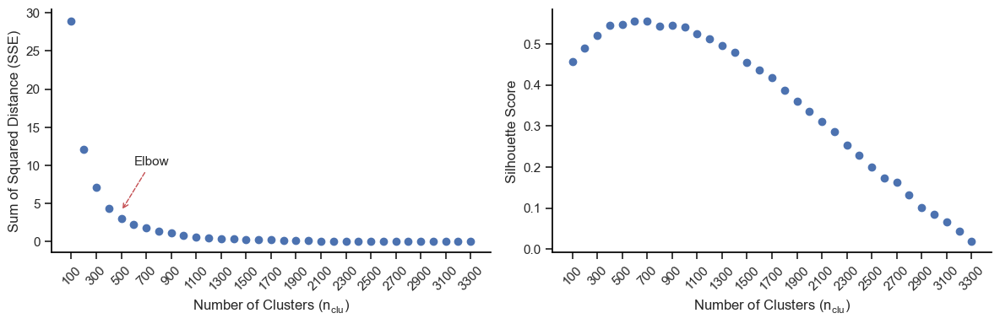

In [33]:
fig, axes = plt.subplots(1,2, figsize=(12, 4))
list_ticks = list(range(100, 3400,200))
axes[0].plot(cluster_list, scores_df['Sum of Squared Distance'], 'o')
axes[0].set_xlabel('Number of Clusters ($n_{clu}$)')
axes[0].set_ylabel('Sum of Squared Distance (SSE)')
axes[0].annotate("Elbow", xy=(500, 4), xytext=(600, 10), arrowprops=dict(arrowstyle="->",color='r',
                             lw=1,
                             ls='--'), fontsize=11)
axes[0].set_xticks(list_ticks)
axes[0].set_xticklabels(list_ticks, rotation=45)


axes[1].plot(cluster_list, scores_df['Silhouette Score'], 'o')
axes[1].set_xlabel('Number of Clusters ($n_{clu}$)')
axes[1].set_ylabel('Silhouette Score')
axes[1].set_xticks(list_ticks)
axes[1].set_xticklabels(list_ticks, rotation=45)

plt.tight_layout()
plt.savefig(run+"/plots/cluster_analysis.png", bbox_inches='tight')

/var/folders/hb/8jmqlr8502jd4_jj817kmrq00000gn/T/ipykernel_59757/2684908630.py:76: FutureWarning:

Currently, index_parts defaults to True, but in the future, it will default to False to be consistent with Pandas. Use `index_parts=True` to keep the current behavior and True/False to silence the warning.



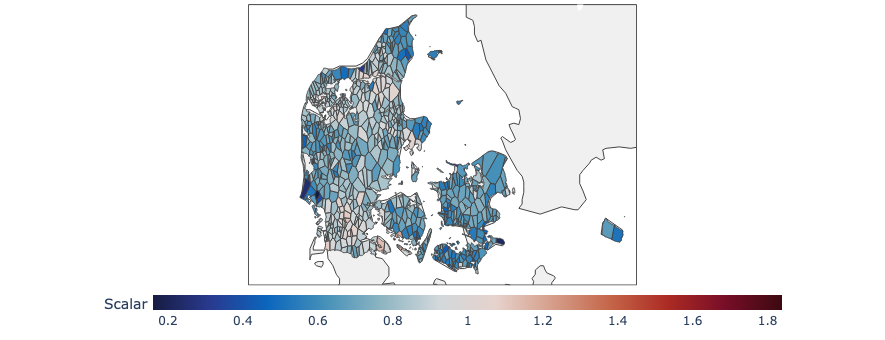

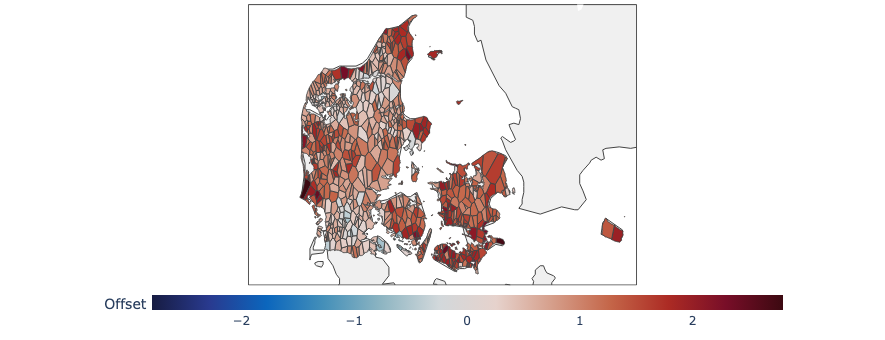

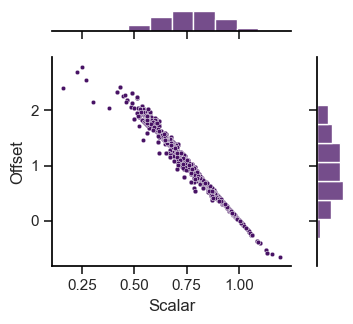

In [73]:
# trying out simons code
from scipy.spatial import Voronoi
import shapely
import matplotlib

def cluster_turbines(num_clu, turb_train, train=False, *args):
    # fitting clusters to training data
    kmeans = KMeans(
            init="random",
            n_clusters = num_clu,
            n_init = 10,
            max_iter = 300,
            random_state = 42
        )
    kmeans.fit(turb_train[['lat','lon']])
        
    if train == True:
        turb_train['cluster'] = kmeans.predict(turb_train[['lat','lon']])
        return kmeans, turb_train
    else:
        turb_info = args[0]
        turb_info['cluster'] = kmeans.predict(turb_info[['lat','lon']])
        return kmeans, turb_info

country='DK'
time_res = 'fixed'
num_clu = 700

turb_info_train = pd.read_csv(run+'/training/simulated-turbines/'+country+'_train_turb_info.csv')
factors = pd.read_csv(run+'/training/correction-factors/'+country+'_factors_'+time_res+'_'+str(num_clu)+'.csv')

kmeans, df = cluster_turbines(num_clu, turb_info_train.copy(), False, turb_info_train[turb_info_train['type']=='onshore'].copy())
df = df.merge(factors[['cluster','scalar','offset']], on='cluster')

g = sns.jointplot(x="scalar",y="offset",data=df,
    s=10,marginal_kws=dict(bins=10),
    color='#471164FF'
)
g.fig.set_figwidth(3.7)
g.fig.set_figheight(3.4)
plt.ylabel('Offset')
plt.xlabel('Scalar')
plt.tight_layout()
plt.savefig(run+"/plots/offset_vs_scalar.png", bbox_inches='tight')

# Define extra points around the edge, otherwise the edge regions will go off to infinity
extra_points = np.array([
    [turb_info_train.lon.min() - 1, turb_info_train.lat.min() - 1],
    [turb_info_train.lon.min() - 1, turb_info_train.lat.max() + 1],
    [turb_info_train.lon.max() + 1, turb_info_train.lat.min() - 1],
    [turb_info_train.lon.max() + 1, turb_info_train.lat.max() + 1]
])
all_points = np.concatenate([kmeans.cluster_centers_[:,::-1], extra_points])

# Create voronoi polygons
vor = Voronoi(all_points)
lines = [
    shapely.geometry.LineString(vor.vertices[line])
    for line in vor.ridge_vertices
    if -1 not in line
]
voronoi_polygons = []
for poly in shapely.ops.polygonize(lines):
    voronoi_polygons.append(poly)

# Load coastline and regional data
    
# This I drew by hand, bounding Denmark
denmark_region_file = gpd.read_file(run+'/coastline/denmark_region.shp') 
denmark_polygon = shapely.geometry.Polygon(denmark_region_file.iloc[0].geometry)

# This is from global coastline data, so we can check for land
coastline_file = gpd.read_file(run+'/coastline/polygons.shp')

denmark_el = gpd.read_file(run+'/shapee/denmark_region.shp')
denmark_el.explode()
denmark_el = shapely.ops.unary_union(denmark_el.geometry)
# denmark_el

# Now we can use the Denmark and coastline polygons to crop the voronoi polygons to land
voronoi_polygons = [p.intersection(denmark_el) for p in voronoi_polygons]

# Get cluster IDs for each polygon
final_polygons = []
polygon_cluster_ids = []
for p in voronoi_polygons:
    # Some polygons have no area, so we need to catch the exception
    # Maybe this is something to do with offshore regions?
    try:
        polygon_centroid_lat = p.centroid.coords.xy[1][0]
        polygon_centroid_lon = p.centroid.coords.xy[0][0]
        polygon_centroid_df = pd.DataFrame({'lat': [polygon_centroid_lat], 'lon': [polygon_centroid_lon]})
        cluster = kmeans.predict(polygon_centroid_df)[0]
        final_polygons.append(p)
        polygon_cluster_ids.append(cluster)
    except:
        pass


gdf = gpd.GeoDataFrame(
    df,
    geometry=gpd.points_from_xy(df["lon"], df["lat"], crs="EPSG:4326"),
).dissolve("cluster").reset_index()

gdf2 = gpd.GeoDataFrame(
    {'cluster':polygon_cluster_ids},
    geometry=final_polygons)

maps = gdf2.merge(gdf[['scalar','cluster','offset']], on="cluster")


fig = px.choropleth(
    maps,
    geojson=maps.geometry,
    locations=maps.index,
    color="scalar",
    color_continuous_scale='balance',
    color_continuous_midpoint=1
)
fig.update_geos(
    resolution=50, 
    center=dict(lon=11.2, lat=56.2),
    lataxis_range=[54.6, 58], 
    lonaxis_range=[7,15.5],
    projection_type='mercator',
    landcolor=bg_colour
)
fig.update_layout(
    margin=dict(l=5, r=5, t=5, b=5),
    width = 465, height = 340,
    coloraxis_colorbar=dict(
        len=0.8,
        yanchor = 'top',
        y=0,
        thickness=15,
        orientation='h',
        title="Scalar"
))
fig.show()

fig = px.choropleth(
    maps,
    geojson=maps.geometry,
    locations=maps.index,
    color="offset",
    color_continuous_scale='balance',
    color_continuous_midpoint=0,
)
fig.update_geos(
    resolution=50, 
    center=dict(lon=11.2, lat=56.2),
    lataxis_range=[54.6, 58], 
    lonaxis_range=[7,15.5],
    projection_type='mercator',
    landcolor=bg_colour
)

fig.update_layout(
    margin=dict(l=5, r=5, t=5, b=5),
    width = 465, height = 340,
    coloraxis_colorbar=dict(
        len=0.8,
        yanchor = 'top',
        y=0,
        thickness=15,
        orientation='h',
        title="Offset"
))
fig.show()

In [65]:
def calc_error_fixed(type, df_sim, df_obs, turb_info, train=False):
    if train == True:
        df_obs = df_obs.pivot(
                index=['year','month'], 
                columns='ID', 
                values='obs').reset_index(drop=True)
        df_obs['time'] = np.arange(str(2015)+'-01', str(2019+1)+'-01', dtype='datetime64[M]')
        df_obs['month'] = df_obs.time.dt.month
        df_obs['year'] = df_obs.time.dt.year
        df_obs_monthly = df_obs.drop(columns=['time']).groupby(['year','month']).mean().reset_index()
        df_obs_monthly = df_obs_monthly.melt(id_vars=['year','month'], var_name='ID', value_name='cf')
    else:
        df_obs['time'] = pd.to_datetime(df_obs['time'])
        df_obs['month'] = df_obs.time.dt.month
        df_obs['year'] = df_obs.time.dt.year
        df_obs_monthly = df_obs.drop(columns=['time']).set_index('month').reset_index()
        df_obs_monthly = df_obs_monthly.melt(id_vars=['year','month'], var_name='ID', value_name='cf')
    
    df_sim['time'] = pd.to_datetime(df_sim['time'])
    df_sim['month'] = df_sim.time.dt.month
    df_sim['year'] = df_sim.time.dt.year
    df_sim_monthly = df_sim.drop(columns=['time']).groupby(['year','month']).mean().reset_index()
    df_sim_monthly = df_sim_monthly.melt(id_vars=['year','month'], var_name='ID', value_name='cf')

    turb_info['ID'] = turb_info['ID'].astype(str)
    df_obs_monthly['ID'] = df_obs_monthly['ID'].astype(str)
    df_sim_monthly['ID'] = df_sim_monthly['ID'].astype(str)
    
    merged = pd.merge(df_sim_monthly, df_obs_monthly, on=['ID', 'month', 'year'], suffixes=('_sim', '_obs'))
    if type == 'regional-error':
        merged = pd.merge(merged, turb_info[['ID', 'capacity','region', 'In training?']], on='ID')
    elif (type == 'cluster-error'):
        merged = pd.merge(merged, turb_info[['ID', 'capacity','cluster']], on='ID')
    elif (type == 'turbine-error'):
        merged = pd.merge(merged, turb_info[['ID', 'capacity','distance']], on='ID')
    elif type == 'monthly-error':
        merged = pd.merge(merged, turb_info[['ID', 'capacity','In training?']], on='ID')
    else:
        merged = pd.merge(merged, turb_info[['ID', 'capacity']], on='ID')
    
    
    merged = merged.dropna(subset=['cf_sim', 'cf_obs', 'capacity']).reset_index(drop=True)

    def weighted_avg(df, values, weights):
        return (df[values] * df[weights]).sum() / df[weights].sum()


    if type == 'monthly-error': # country-monthly
        wavg_obs = lambda x: weighted_avg(merged.loc[x.index], 'cf_obs', 'capacity')
        wavg_sim = lambda x: weighted_avg(merged.loc[x.index], 'cf_sim', 'capacity')
        count = lambda x: merged.loc[x.index]['ID'].count()
        averaged = merged.groupby(['month', 'In training?']).agg({'cf_obs': wavg_obs, 'cf_sim': wavg_sim, 'ID': count}).reset_index().set_index('month')
        # averaged['diff'] = (np.abs(averaged['cf_sim'] - averaged['cf_obs'])/averaged['cf_obs']) * 100
        averaged['diff'] = (averaged['cf_sim'] - averaged['cf_obs'])

        averaged_total = merged.groupby(['month']).agg({'cf_obs': wavg_obs, 'cf_sim': wavg_sim, 'ID': count})
        # averaged_total['diff'] = (np.abs(averaged_total['cf_sim'] - averaged_total['cf_obs'])/averaged_total['cf_obs'])*100
        averaged_total['diff'] = (averaged_total['cf_sim'] - averaged_total['cf_obs'])
        averaged_total['In training?'] = 'Both'

        averaged = pd.concat([averaged, averaged_total])
        
        be = averaged[['diff','In training?','ID']]
        return be

    
    elif type == 'regional-error': # region-yearly
        averaged = merged.groupby('ID').agg({'cf_obs': np.mean, 'cf_sim': np.mean, 'region': 'first', 'In training?': 'first', 'capacity':'first'}).reset_index()
        wavg_obs = lambda x: weighted_avg(averaged.loc[x.index], 'cf_obs', 'capacity')
        wavg_sim = lambda x: weighted_avg(averaged.loc[x.index], 'cf_sim', 'capacity')
        count = lambda x: averaged.loc[x.index]['ID'].count()
        averaged_type = averaged.groupby(['region','In training?']).agg({'cf_obs': wavg_obs, 'cf_sim': wavg_sim, 'ID': count})
        averaged_type['diff'] = (np.abs(averaged_type['cf_sim'] - averaged_type['cf_obs'])/averaged_type['cf_obs'])*100
        # averaged_type['diff'] = np.abs(averaged_type['cf_sim'] - averaged_type['cf_obs'])
        averaged_type = averaged_type.reset_index().set_index('region')

        averaged_total = averaged.groupby('region').agg({'cf_obs': wavg_obs, 'cf_sim': wavg_sim, 'ID': count})
        # averaged_total['diff'] = (np.abs(averaged_total['cf_sim'] - averaged_total['cf_obs'])/averaged_total['cf_obs'])*100
        averaged_total['diff'] = averaged_total['cf_sim'] - averaged_total['cf_obs']
        
        averaged_total['In training?'] = 'Both'
        
        averaged = pd.concat([averaged_type, averaged_total])
        be = averaged[['diff','In training?','ID','cf_obs','cf_sim']]
        return be
        
    elif type == 'turbine-error': # region-yearly
        averaged = merged.groupby('ID').mean()
        averaged['diff'] = averaged['cf_sim'] - averaged['cf_obs']
        # averaged['diff'] = (np.abs(averaged['cf_sim'] - averaged['cf_obs'])/averaged['cf_obs'])*100
        return averaged

    elif type == 'cluster-error': # cluster-yearly
        averaged = merged.groupby('ID').mean().reset_index()
        wavg_obs = lambda x: weighted_avg(averaged.loc[x.index], 'cf_obs', 'capacity')
        wavg_sim = lambda x: weighted_avg(averaged.loc[x.index], 'cf_sim', 'capacity')
        count = lambda x: averaged.loc[x.index]['ID'].count()
        averaged = averaged.groupby('cluster').agg({'cf_obs': wavg_obs, 'cf_sim': wavg_sim, 'ID': count})
        averaged['diff'] = averaged['cf_sim'] - averaged['cf_obs']
        
        be = averaged['diff']
        return be, averaged['ID']
        
    elif type == 'temporal-focus': # country-monthly
        wavg_obs = lambda x: weighted_avg(merged.loc[x.index], 'cf_obs', 'capacity')
        wavg_sim = lambda x: weighted_avg(merged.loc[x.index], 'cf_sim', 'capacity')
        averaged = merged.groupby('month').agg({'cf_obs': wavg_obs, 'cf_sim': wavg_sim})
        averaged['diff'] = averaged['cf_sim'] - averaged['cf_obs']
        
        rmse = np.sqrt((averaged['diff']**2).mean())
        mae = np.abs(averaged['diff']).mean()
        mbe = averaged['diff'].mean()
        
    elif type == 'spatial-focus': # turbine-yearly
        averaged = merged.groupby('ID').mean()
        averaged['diff'] = averaged['cf_sim'] - averaged['cf_obs']
        averaged['sqdiff'] = averaged['diff']**2
        averaged['abdiff'] = np.abs(averaged['diff'])
        wavg_sq = lambda x: weighted_avg(averaged.loc[x.index], 'sqdiff', 'capacity')
        wavg_ab = lambda x: weighted_avg(averaged.loc[x.index], 'abdiff', 'capacity')
        wavg_diff = lambda x: weighted_avg(averaged.loc[x.index], 'diff', 'capacity')
        
        rmse = np.sqrt(averaged.agg({'sqdiff': wavg_sq}))
        mae = averaged.agg({'abdiff': wavg_ab})
        mbe = averaged.agg({'diff': wavg_diff})
        
    elif type == 'total':
        merged['diff'] = merged['cf_sim'] - merged['cf_obs']
        merged['abdiff'] = np.abs(merged['diff'])
        merged['sqdiff'] = merged['diff']**2
        merged = merged.groupby('ID').mean()
        wavg_sq = lambda x: weighted_avg(merged.loc[x.index], 'sqdiff', 'capacity')
        wavg_ab = lambda x: weighted_avg(merged.loc[x.index], 'abdiff', 'capacity')
        wavg_diff = lambda x: weighted_avg(merged.loc[x.index], 'diff', 'capacity')
        averaged = merged.agg({"sqdiff": wavg_sq, 'abdiff': wavg_ab, 'diff': wavg_diff})
        
        rmse = np.sqrt(averaged['sqdiff'])
        mae = averaged['abdiff']
        mbe = averaged['diff']

    return rmse, mae, mbe

def overall_error(type, run, country, turb_info, cluster_list, time_res_list, train, *args):
    rmse_all = []
    mae_all = []
    mbe_all = []
    cluster_all = []
    time_all = []
    
    if train == True:
        obs_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_obs_cf.csv')
        unc_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_unc_cf.csv', parse_dates=['time'])
    else:
        year_test = args[0]
        obs_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_obs_cf.csv', parse_dates=['time'])
        unc_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_unc_cf.csv', parse_dates=['time'])
    
    rmse, mae, mbe = calc_error_fixed(type, unc_cf, obs_cf, turb_info, train)
    
    rmse_all.append(rmse)
    mae_all.append(mae)
    mbe_all.append(mbe)
    cluster_all.append(1)
    time_all.append('uncorrected')
    
    for num_clu in cluster_list:
        for time_res in time_res_list:
            if train == True:
                cor_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_'+time_res+'_'+str(num_clu)+'_cor_cf.csv', parse_dates=['time'])
            else:
                cor_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_'+time_res+'_'+str(num_clu)+'_cor_cf.csv', parse_dates=['time'])
                
            rmse, mae, mbe = calc_error_fixed(type, cor_cf, obs_cf, turb_info, train)
            
            rmse_all.append(rmse)
            mae_all.append(mae)
            mbe_all.append(mbe)
            cluster_all.append(num_clu)
            time_all.append(time_res)
    
    
    df_metrics = pd.DataFrame(list(zip(np.ravel(cluster_all), np.ravel(time_all), np.ravel(rmse_all), np.ravel(mae_all), np.ravel(mbe_all))), 
                 columns =['num_clu', 'time_res', 'rmse', 'mae', 'mbe'])
    
    # if train == True:
    #     df_metrics.to_csv(run+'/results/'+country+'_train_metrics.csv', index = None)
    # else:
    #     df_metrics.to_csv(run+'/results/'+country+'_test_metrics.csv', index = None)
    return df_metrics


def cluster_turbines(num_clu, turb_train, train=False, *args):
    # fitting clusters to training data
    kmeans = KMeans(
            init="random",
            n_clusters = num_clu,
            n_init = 10,
            max_iter = 300,
            random_state = 42
        )
    kmeans.fit(turb_train[['lat','lon']])
        
    if train == True:
        turb_train['cluster'] = kmeans.predict(turb_train[['lat','lon']])
        return turb_train
    else:
        turb_info = args[0]
        turb_info['cluster'] = kmeans.predict(turb_info[['lat','lon']])
        turb_info['distance'] = kmeans.transform(turb_info[['lat','lon']]).min(axis=1)
        return turb_info
        
    
def uncor_error(type, run, country, turb_info, cluster_list, time_res_list, train=True, *args):
    obs_all = []
    sim_all = []
    err_all = []
    cluster_all = []
    time_all = []
    type_all = []
    count_all = []
    offshore_all = []
    
    
    if train == True:
        obs_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_obs_cf.csv')
        unc_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_unc_cf.csv', parse_dates=['time'])
    else:
        year_test = args[0]
        obs_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_obs_cf.csv', parse_dates=['time'])
        unc_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_unc_cf.csv', parse_dates=['time'])


    
    
    if type == 'regional-error':
        error = calc_error_fixed(type, unc_cf, obs_cf, turb_info, train)
        err_all.append(error['diff'])
        obs_all.append(error['cf_obs'])
        sim_all.append(error['cf_sim'])
        cluster_all.append([1]*len(error['diff']))
        time_all.append(['uncorrected']*len(error['diff']))
        type_all.append(error.index)
        offshore_all.append(error['In training?'])
        count_all.append(error['ID'])
    elif type == 'monthly-error':
        error = calc_error_fixed(type, unc_cf, obs_cf, turb_info, train)
        err_all.append(error['diff'])
        cluster_all.append([1]*len(error['diff']))
        time_all.append(['uncorrected']*len(error['diff']))
        offshore_all.append(error['In training?'])
        type_all.append(error.index)

    # elif type == 'turbine-error':
    #     err_all.append(error['diff'])
    #     cluster_all.append([1]*len(error['diff']))
    #     time_all.append(['uncorrected']*len(error['diff']))
    #     type_all.append(error.index)
    #     count_all.append(error['distance'])


    for num_clu in cluster_list:
        for time_res in time_res_list:
            if train == True:
                cor_cf = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_'+time_res+'_'+str(num_clu)+'_cor_cf.csv', parse_dates=['time'])
            else:
                cor_cf = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_'+time_res+'_'+str(num_clu)+'_cor_cf.csv', parse_dates=['time'])


            if type == 'regional-error':
                error = calc_error_fixed(type, cor_cf, obs_cf, turb_info, train)
                err_all.append(error['diff'])
                obs_all.append(error['cf_obs'])
                sim_all.append(error['cf_sim'])
                cluster_all.append([num_clu]*len(error['diff']))
                time_all.append([time_res]*len(error['diff']))
                type_all.append(error.index)
                offshore_all.append(error['In training?'])
                count_all.append(error['ID'])
                
            elif type == 'monthly-error':
                error = calc_error_fixed(type, cor_cf, obs_cf, turb_info, train)
                err_all.append(error['diff'])
                cluster_all.append([num_clu]*len(error['diff']))
                time_all.append([time_res]*len(error['diff']))
                offshore_all.append(error['In training?'])
                type_all.append(error.index)
                count_all.append(error['ID'])

            elif type == 'turbine-error':
                turb_info_train = pd.read_csv(run+'/training/simulated-turbines/'+country+'_train_turb_info.csv')
                clus_info = cluster_turbines(num_clu, turb_info_train, False, turb_info)
                error = calc_error_fixed(type, cor_cf, obs_cf, clus_info, False)
                err_all.append(error['diff'])
                cluster_all.append([num_clu]*len(error['diff']))
                time_all.append([time_res]*len(error['diff']))
                type_all.append(error.index)
                count_all.append(error['distance'])
                
    if type == 'monthly-error':
        df_metrics = pd.DataFrame(list(zip(np.ravel(offshore_all), np.ravel(type_all), np.ravel(cluster_all), np.ravel(time_all), np.ravel(err_all))), 
                 columns =['In training?','month','num_clu', 'time_res', 'diff'])
    elif type == 'regional-error':
        df_metrics = pd.DataFrame(list(zip(np.ravel(offshore_all), np.ravel(type_all), np.ravel(count_all), np.ravel(cluster_all), np.ravel(time_all), np.ravel(obs_all), np.ravel(sim_all), np.ravel(err_all))), 
                 columns =['In training?','region','count','num_clu', 'time_res','obs','sim','diff'])
    elif type == 'turbine-error':
        df_metrics = pd.DataFrame(list(zip(np.ravel(type_all), np.ravel(cluster_all), np.ravel(time_all), np.ravel(count_all), np.ravel(err_all))), 
                 columns =['ID','num_clu', 'time_res','distance','diff'])

    return df_metrics

# Analysing Input Data

In [4]:
turb_info_train = pd.read_csv(run+'/training/simulated-turbines/'+country+'_train_turb_info.csv')
train_obs = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_obs_cf.csv')

turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')
test_obs = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_obs_cf.csv', parse_dates=['time'])
turb_info['In training?'] = np.where(turb_info.ID.isin(turb_info_train.ID), 'Yes', 'No')

### Training analysis

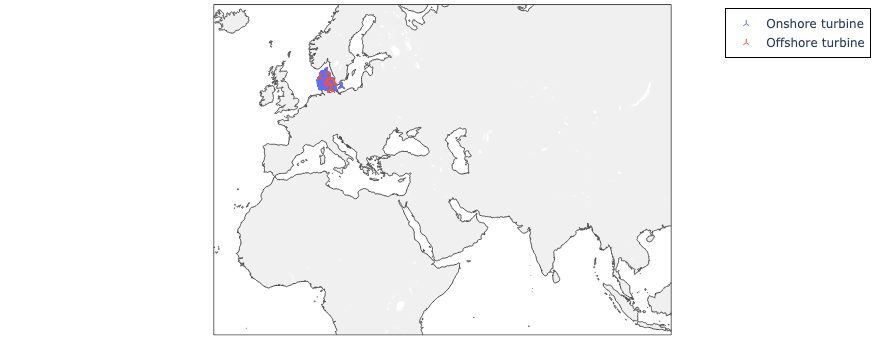

In [20]:
# Plot of where all the turbines used in training are located
fig = px.scatter_geo(turb_info_train,lat='lat',lon='lon',color='type')

fig.update_geos(
    resolution=50, 
    center=dict(lon=11.2, lat=56.2),
    lataxis_range=[54.6, 58], 
    lonaxis_range=[7,15.5],
    projection_type='mercator',
    landcolor=bg_colour
)
# capitalise 
fig.for_each_trace(lambda t: t.update(name = t.name.title()+' turbine'))
fig.update_traces(marker=dict(size=5, symbol="y-up-open"))
fig.update_layout(
    margin=dict(l=5, r=5, t=5, b=5),width = 465, height = 340,
    legend=dict(orientation="v", yanchor="top", y=0.99, xanchor="right", x=0.99, bordercolor="Black",borderwidth=1, title=None),
    # legend_title_side='top center',legend_title_text='Type'
)
fig.show()

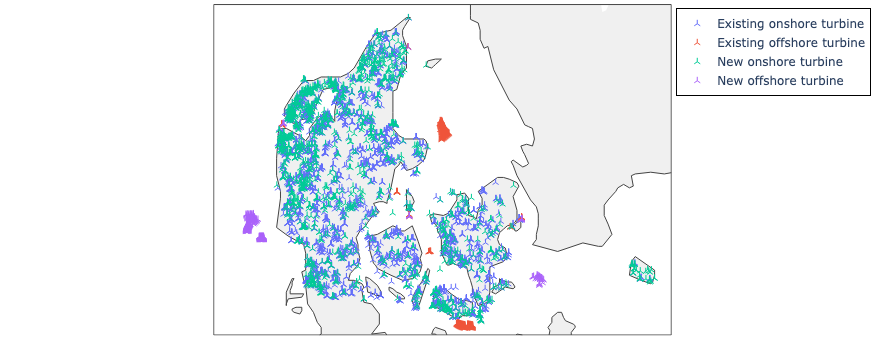

In [17]:
turb_info.loc[(turb_info['type'] == 'onshore') & (turb_info['In training?'] == 'Yes'), 'In training?'] = 'Existing onshore turbine'
turb_info.loc[(turb_info['type'] == 'offshore') & (turb_info['In training?'] == 'Yes'), 'In training?'] = 'Existing offshore turbine'
turb_info.loc[(turb_info['type'] == 'onshore') & (turb_info['In training?'] == 'No'), 'In training?'] = 'New onshore turbine'
turb_info.loc[(turb_info['type'] == 'offshore') & (turb_info['In training?'] == 'No'), 'In training?'] = 'New offshore turbine'
# turb_info = turb_info.sort_values('In training?', ascending=True)

# Plot of where all the turbines used in training are located
fig = px.scatter_geo(turb_info,lat='lat',lon='lon',color = 'In training?', category_orders={'In training?':['Existing onshore turbine','Existing offshore turbine','New onshore turbine','New offshore turbine']})#,color_orders={"In Training?": ["Yes (onshore)","Yes (offshore)", "No (onshore)", "No (offshore)"]})

fig.update_geos(
    resolution=50, 
    center=dict(lon=11.2, lat=56.2),
    lataxis_range=[54.6, 58], 
    lonaxis_range=[7,15.5],
    projection_type='mercator',
    landcolor=bg_colour
)
fig.update_traces(marker=dict(size=5, symbol="y-up-open"))
fig.update_layout(
    margin=dict(l=5, r=5, t=5, b=5),width = 465, height = 340,
    legend=dict(orientation="v", yanchor="top", y=0.99, xanchor="right", x=0.99, bordercolor="Black",borderwidth=1, title=None),
    # legend_title_side='top center' 
)

fig.show()

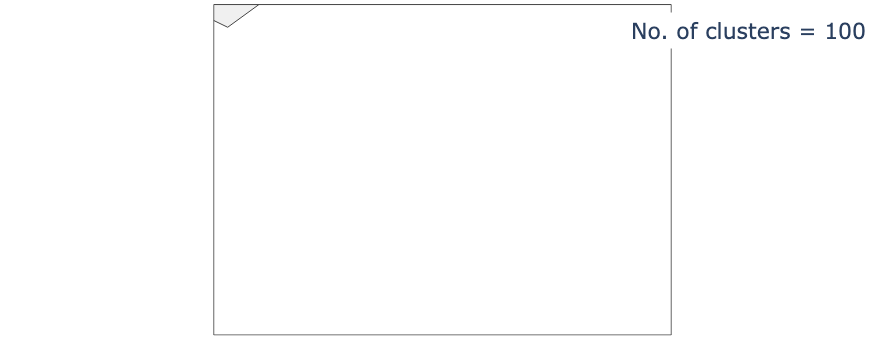

In [5]:
from vwf.bias_correction import (
    cluster_turbines
)

# clus_info_train = cluster_turbines(2, turb_info_train, True)
clus_info_train = cluster_turbines(100, turb_info_train, True)

clus_info_train["cluster"] = clus_info_train["cluster"].astype(str)
fig = px.scatter_geo(clus_info_train, lat ='lat',lon ='lon', 
                     color = 'cluster', symbol='type', symbol_map={'onshore':'y-up-open', 'offshore':'y-up-open'},
)
fig.update_geos(
    resolution=50, 
    center=dict(lon=11.2, lat=56.2),
    lataxis_range=[54.6, 58], 
    lonaxis_range=[7,15.5],
    projection_type='mercator',
    landcolor=bg_colour
)

fig.add_annotation(
    x=0.99, y=0.98, # position
    text=r'No. of clusters = 100',
    showarrow=False,
    font=dict(
                # color="black",
                size=22
            ),
    borderpad=4,
    bgcolor="white",
)
# {'In Training?':['onshore':y-up-open, 'offshore':circle]}
# fig.update_traces(marker=dict(size=5, symbol=['y-up-open','circle']))
# fig.update_traces(marker=dict(size=5))

fig.update(layout_coloraxis_showscale=False, layout_showlegend=False)
fig.update_layout(margin=dict(l=5, r=5, t=5, b=5),width = 465, height = 340)
fig.show()

### ERA 5 Bias Analysis

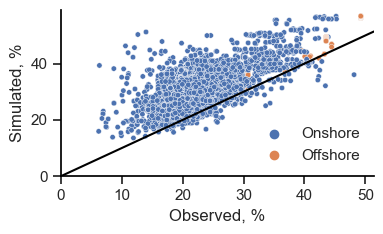

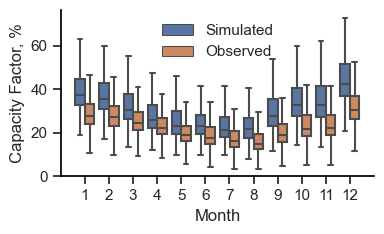

In [115]:
gen_train = pd.read_csv(run+'/training/'+country+'_train_gen_cf.csv')
gen_train['ID'] = gen_train['ID'].astype(str)
turb_info_train['ID'] = turb_info_train['ID'].astype(str)
gen_train = gen_train.merge(turb_info_train[['ID','type']], on='ID')

comp_total = gen_train.groupby(['ID','type']).agg({"sim": np.mean, "obs": np.mean}).reset_index()
comp_total['obs'] = comp_total['obs']*100
comp_total['sim'] = comp_total['sim']*100


fig, axes = plt.subplots(1, figsize=(4, 2.5))

sns.scatterplot(x="obs",y="sim",data=comp_total, s=15, marker='o',hue='type',ax=axes) # color='#471164FF'
axes.set_ylabel('Simulated, %')
axes.set_xlabel('Observed, %')
axes.set_xlim(0)
axes.set_ylim(0)
x0, x1 = axes.get_xlim()
y0, y1 = axes.get_ylim()
lims = [max(x0, y0), min(x1, y1)]
axes.plot(lims, lims, 'black')
handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles, ['Onshore', 'Offshore'], ncol=1, frameon=False)

plt.tight_layout()
plt.savefig(run+'/plots/era5_'+country+'_train_bias.png', bbox_inches='tight')

comp_month = gen_train.groupby(['ID','month']).agg({"sim": np.mean, "obs": np.mean}).reset_index()
comp_month = comp_month.melt(id_vars=['ID','month'], var_name="model", value_name="cf")
comp_month['cf'] = comp_month['cf']*100

fig, axes = plt.subplots(1, figsize=(4, 2.5))
sns.boxplot(data=comp_month,x="month", y="cf", hue="model",showfliers = False,ax=axes)
axes.set_ylabel('Capacity Factor, %')
axes.set_xlabel('Month')
axes.set_xlim(-1,12)
axes.set_ylim(0)

handles, labels = plt.gca().get_legend_handles_labels()
plt.legend(handles, ['Simulated', 'Observed'], ncol=1, loc='upper center' , frameon=False)
# plt.figlegend(handles, labels, loc = 'center left', bbox_to_anchor=(-0.25, 0.5), ncol=1, title='Temporal Frequency\n            ($t_{freq}$)', frameon=False)
plt.tight_layout()
plt.savefig(run+'/plots/era5_'+country+'_train_monthly.png', bbox_inches='tight')

In [131]:
def regional_cf(regions, num_clu, time_res, turb_info, turb_base, test=False):
    def regional_info(regions,turb_info, turb_base, remove=None):
        # create the regional index
        kmeans = KMeans(
                    init="random",
                    n_clusters = regions,
                    n_init = 10,
                    max_iter = 300,
                    random_state = 42
                )
        kmeans.fit(turb_base[['lat','lon']])
        
        # adding cluster labels to data
        turb_info['region_delete'] = kmeans.predict(turb_info[['lat','lon']])
        
        # order the clusters/labels from left to right
        region_info = turb_info.groupby('region_delete', as_index=False)[['lat','lon']].mean()
        region_info = region_info.sort_values('lon').reset_index(drop=True)
        region_info['region'] = region_info.index
        turb_info = turb_info.merge(region_info[['region_delete','region']], on='region_delete',how='left')
        turb_info = turb_info.drop('region_delete',axis=1)
    
        if remove == 'new_offshore':
        ## Use this to filter out offshore etc for plotting
            turb_info = turb_info.drop(turb_info[(turb_info['type'] == 'offshore') & (turb_info['In training?'] == 'No')].index).reset_index(drop=True)
        elif remove == 'all_offshore':
            turb_info = turb_info.drop(turb_info[(turb_info['type'] == 'offshore')].index).reset_index(drop=True)
        # turb_info = turb_info.drop(turb_info[(turb_info['In training?'] == 'No')].index).reset_index(drop=True)
        return turb_info
    
    turb_info = regional_info(regions, turb_info, turb_base)
    
    ## Use this to filter out offshore etc for plotting
    # turb_info = turb_info.drop(turb_info[(turb_info['type'] == 'offshore') & (turb_info['In training?'] == 'No')].index).reset_index(drop=True)
    # turb_info = turb_info.drop(turb_info[(turb_info['In training?'] == 'No')].index).reset_index(drop=True)

    region_info = turb_info.copy()

    def weighted_region_cf(df, turb_info, name):
        df = df.melt(
                id_vars=["time"], # adding in turbine ID for merging
                var_name="ID", 
                value_name=name
            )
        
        df["ID"] = df["ID"].astype(str)
        turb_info["ID"] = turb_info["ID"].astype(str)

        ## Use this to filter out offshore etc for plotting
        df = df.loc[df['ID'].isin(turb_info['ID'])].reset_index(drop=True)
        
        df_all = df.copy()
        df = df.merge(turb_info[['ID','region','capacity','lat','lon']],on='ID')
    
        def weighted_avg(df, values, weights):
                return (df[values] * df[weights]).sum() / df[weights].sum()
    
        wavg = lambda x: weighted_avg(df.loc[x.index], name, 'capacity')

        df_region = df.groupby('region').agg({name: wavg, 'lat': np.mean, 'lon': np.mean})
        return df_region, df_all
    
    # loading files
    obs = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_obs_cf.csv', parse_dates=['time'])
    unc = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_unc_cf.csv', parse_dates=['time'])
    obs_weighted, obs_all = weighted_region_cf(obs, turb_info, 'obs')
    unc_weighted, unc_all = weighted_region_cf(unc, turb_info, 'unc')

    if test == True:
        def load_cf(num_clu, time_res, year_test=2020):
            cor = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_'+time_res+'_'+str(num_clu)+'_cor_cf.csv', parse_dates=['time'])
            return cor
            
        cor = load_cf(num_clu, time_res)
        cor_one = load_cf(1, 'fixed')
        cor_weighted, cor_all = weighted_region_cf(cor, turb_info, 'cor')
        cor_one_weighted, cor_one_all = weighted_region_cf(cor_one, turb_info, 'cor-base')

        all_cf = obs_all.merge(unc_all,on=['ID', 'time']).merge(cor_all,on=['ID', 'time']).merge(cor_one_all,on=['ID', 'time'])
        all_cf = all_cf.merge(turb_info[['ID','lat','lon','capacity']],on='ID')
        weighted_region = obs_weighted.merge(unc_weighted[['unc']],on=['region']).merge(cor_weighted[['cor']],on=['region']).merge(cor_one_weighted[['cor-base']],on=['region'])

    else: 
        all_cf = obs_all.merge(unc_all,on=['ID', 'time'])
        all_cf = all_cf.merge(turb_info[['ID','lat','lon','capacity']],on='ID')
        weighted_region = obs_weighted.merge(unc_weighted[['unc']],on=['region'])
    
    # # return weighted_region, all_cf, region_info
    region_cf = weighted_region.reset_index().melt(id_vars=['region','lat','lon'],var_name="model",value_name="cf")

    region_cf['cf'] = region_cf['cf']*100
    
    return region_cf, all_cf, region_info

base_clu = 700
base_freq = 'fixed'
mapped_cf, ignore, ignore = regional_cf(3706, base_clu, base_freq, turb_info_train, turb_info_train, False)
# mapped_cf, ignore, ignore = regional_cf(8, base_clu, base_freq, turb_info[turb_info['type'] == 'onshore'], turb_info_train[turb_info_train['type'] == 'onshore'], False)

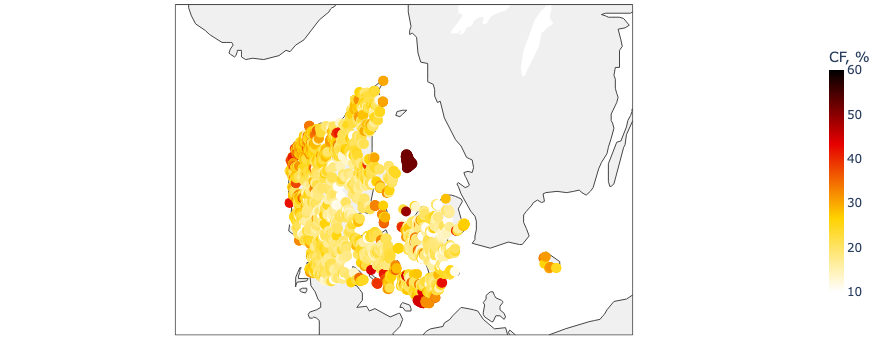

In [133]:
param = 'obs' # choose between 'unc', 'cor', obs'

fig = px.scatter_geo(
    mapped_cf[mapped_cf['model']==param],
    lat='lat',
    lon='lon', 
    color = 'cf',
    color_continuous_scale='hot_r', 
    range_color=(10,60)
) 
fig.update_geos(
    resolution=50, 
    center=dict(lon=11.2, lat=56.2),
    lataxis_range=[54.6, 58], 
    lonaxis_range=[7,15.5],
    projection_type='mercator',
    landcolor=bg_colour
)
fig.update_traces(marker=dict(size=10, opacity=1))
fig.update_layout(
    margin=dict(l=5, r=5, t=5, b=5),
    width = 465, height = 340,
    coloraxis_colorbar=dict(len=0.8,thickness=15)
)
fig.layout.coloraxis.colorbar.title = 'CF, %'
fig.show()

### Exploring Error Plots

In [137]:
temporal_metrics = overall_error('temporal-focus', run, country, turb_info, cluster_list, time_res_list, False, 2020)
spatial_metrics = overall_error('spatial-focus', run, country, turb_info, cluster_list, time_res_list, False, 2020)
total_metrics = overall_error('total', run, country, turb_info, cluster_list, time_res_list, False, 2020)
# train_metrics = overall_error('total', run, country, turb_info_train, cluster_list, time_res_list, True)

Saved to run/DK-onshore-Vestas.V66.2000-calculate_z0/plots/DK_train_error.png

Saved to run/DK-onshore-Vestas.V66.2000-calculate_z0/plots/DK_full_error.png

Saved to run/DK-onshore-Vestas.V66.2000-calculate_z0/plots/DK_temporal_focus_error.png

Saved to run/DK-onshore-Vestas.V66.2000-calculate_z0/plots/DK_spatial_focus_error.png



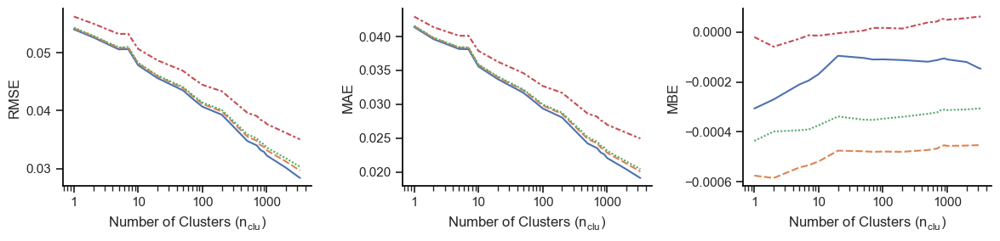

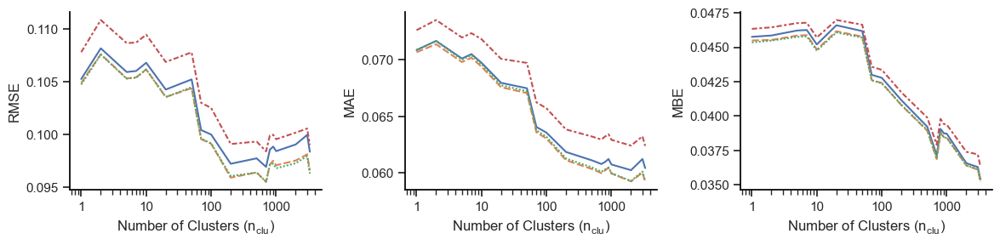

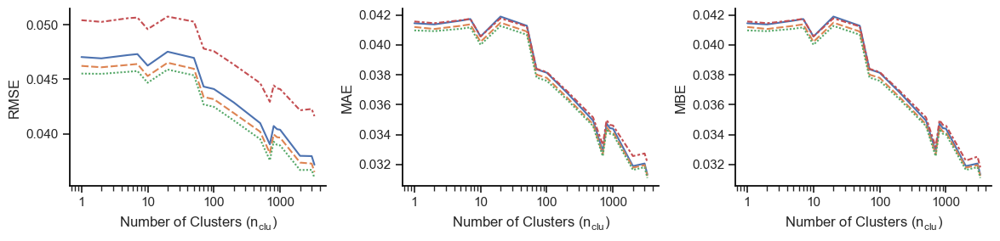

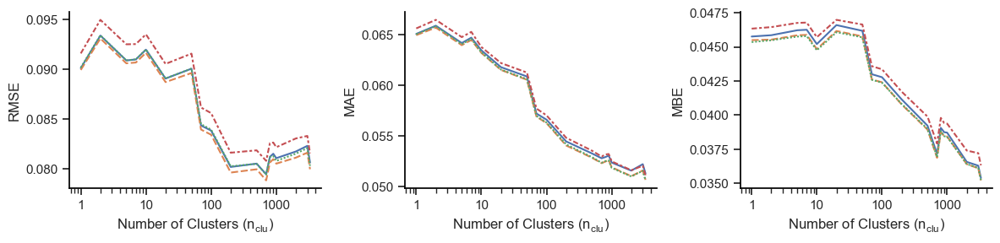

In [93]:
# all generic types of error
def plot_overall_error(run, country, df_metrics, name):
    # fig, axes = plt.subplots(1, 2, figsize=(6.67, 3)) # for normal
    # fig, axes = plt.subplots(1, 2, figsize=(6.8, 3)) # for train with the legend
    fig, axes = plt.subplots(1, 3, figsize=(12, 3)) # for train with the legend
    
    sns.lineplot(
        x='num_clu',
        y='rmse',
        hue ="time_res",
        style="time_res",
        hue_order = ['month', 'bimonth', 'season', 'fixed'],
        style_order= ['month', 'bimonth', 'season', 'fixed'],
        data = df_metrics[(df_metrics['time_res'] != 'uncorrected')],
        ax = axes[0],
        legend = False
    )
    axes[0].set_xscale('log')
    axes[0].set_ylabel('RMSE')
    axes[0].set_xlabel('Number of Clusters ($n_{clu}$)')
    axes[0].set_xticks([1, 10, 100,1000])
    # axes[0].set_yticks([0.0975, 0.1000, 0.1025,0.1050,0.1075,0.1000,0.1100])
    axes[0].get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
    
    sns.lineplot(
        x='num_clu',
        y='mae',
        hue ="time_res",
        style= "time_res",
        hue_order = ['month', 'bimonth', 'season', 'fixed'],
        style_order= ['month', 'bimonth', 'season', 'fixed'],
        data = df_metrics[(df_metrics['time_res'] != 'uncorrected')],
        ax = axes[1],
        legend = False
    )
    
    axes[1].set_xscale('log')
    axes[1].set_ylabel('MAE')
    axes[1].set_xlabel('Number of Clusters ($n_{clu}$)')
    axes[1].set_xticks([1, 10, 100,1000])
    axes[1].get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

    sns.lineplot(
        x='num_clu',
        y='mbe',
        hue ="time_res",
        style= "time_res",
        hue_order = ['month', 'bimonth', 'season', 'fixed'],
        style_order= ['month', 'bimonth', 'season', 'fixed'],
        data = df_metrics[(df_metrics['time_res'] != 'uncorrected')],
        ax = axes[2],
        legend = True
    )
    
    axes[2].set_xscale('log')
    axes[2].set_ylabel('MBE')
    axes[2].set_xlabel('Number of Clusters ($n_{clu}$)')
    axes[2].set_xticks([1, 10, 100,1000])
    axes[2].get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

    
    # fig.suptitle(name)
    axes[2].get_legend().remove()
    handles, labels = plt.gca().get_legend_handles_labels()
    labels = ['Monthly', 'Bimonthly',  'Seasonal', 'Fixed'] # renaming labels
    # plt.figlegend(handles, labels, loc = 'center left', bbox_to_anchor=(-0.25, 0.5), ncol=1, title='Temporal Frequency\n            ($t_{freq}$)', frameon=False)
    plt.tight_layout()
    plt.savefig(run+'/plots/'+country+'_'+name+'_error_appendix.png', bbox_inches='tight')
    return print("Saved to "+str(run+'/plots/'+country+'_'+name+'_error.png')+"\n")



plot_overall_error(run, country, train_metrics, 'train')
plot_overall_error(run, country, total_metrics, 'full')
plot_overall_error(run, country, temporal_metrics, 'temporal_focus')
plot_overall_error(run, country, spatial_metrics, 'spatial_focus')

In [103]:
# plotting modified errors

cluster_list = [1,10,100,500,1000]
time_res_list = ['fixed', 'season', 'bimonth', 'month'] 
country = "DK" 
year_test = 2020 # year you wish to receive a time series for

cluster_mode = 'onshore' # 'all', 'onshore', 'offshore'
add_nan = None # % to remove from data
interp_nan = None # monthly limit to interpretating NaN
fix_turb = None # turbine to fix to #'GE.1.5se' # 'Vestas.V66.2000'

run = country+'-'+cluster_mode
if (add_nan == None) & (interp_nan == None) & (fix_turb == None):
    # run += '-standard-scalar-equation'
    run += '-standard'
else:
    if add_nan != None:
        run += '-r'+str(add_nan)
    if interp_nan != None:
        run += '-i'+str(interp_nan)
    if fix_turb != None:
        run += '-'+fix_turb
run += '-calculate_z0'
run = os.path.join('run',run)
turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')
original_metrics = overall_error('total', run, country, turb_info, cluster_list, time_res_list, False, 2020)

# ################################################################################################################################################
# ################################################################################################################################################
# cluster_mode = 'onshore' # 'all', 'onshore', 'offshore'
# add_nan = 0.3 # % to remove from data
# interp_nan = None # monthly limit to interpretating NaN
# fix_turb = None # turbine to fix to #'GE.1.5se' # 'Vestas.V66.2000'

# run = country+'-'+cluster_mode
# if (add_nan == None) & (interp_nan == None) & (fix_turb == None):
#     # run += '-standard-scalar-equation'
#     run += '-standard'
# else:
#     if add_nan != None:
#         run += '-r'+str(add_nan)
#     if interp_nan != None:
#         run += '-i'+str(interp_nan)
#     if fix_turb != None:
#         run += '-'+fix_turb
# run += '-calculate_z0'
# run = os.path.join('run',run)
# turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')
# missing30_metrics = overall_error('total', run, country, turb_info, cluster_list, time_res_list, False, 2020)

# ################################################################################################################################################
# ################################################################################################################################################
# cluster_mode = 'onshore' # 'all', 'onshore', 'offshore'
# add_nan = 0.5 # % to remove from data
# interp_nan = None # monthly limit to interpretating NaN
# fix_turb = None # turbine to fix to #'GE.1.5se' # 'Vestas.V66.2000'

# run = country+'-'+cluster_mode
# if (add_nan == None) & (interp_nan == None) & (fix_turb == None):
#     # run += '-standard-scalar-equation'
#     run += '-standard'
# else:
#     if add_nan != None:
#         run += '-r'+str(add_nan)
#     if interp_nan != None:
#         run += '-i'+str(interp_nan)
#     if fix_turb != None:
#         run += '-'+fix_turb
# run += '-calculate_z0'
# run = os.path.join('run',run)
# turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')
# missing50_metrics = overall_error('total', run, country, turb_info, cluster_list, time_res_list, False, 2020)

# ################################################################################################################################################
# ################################################################################################################################################
# cluster_mode = 'onshore' # 'all', 'onshore', 'offshore'
# add_nan = None # % to remove from data
# interp_nan = None # monthly limit to interpretating NaN
# fix_turb = 'Vestas.V66.2000' # turbine to fix to #'GE.1.5se' # 'Vestas.V66.2000'

# run = country+'-'+cluster_mode
# if (add_nan == None) & (interp_nan == None) & (fix_turb == None):
#     # run += '-standard-scalar-equation'
#     run += '-standard'
# else:
#     if add_nan != None:
#         run += '-r'+str(add_nan)
#     if interp_nan != None:
#         run += '-i'+str(interp_nan)
#     if fix_turb != None:
#         run += '-'+fix_turb
# run += '-calculate_z0'
# run = os.path.join('run',run)
# turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')
# trained_vestas_metrics = overall_error('total', run, country, turb_info, cluster_list, time_res_list, False, 2020)

# ################################################################################################################################################
# ################################################################################################################################################
# cluster_mode = 'onshore' # 'all', 'onshore', 'offshore'
# add_nan = None # % to remove from data
# interp_nan = None # monthly limit to interpretating NaN
# fix_turb = 'GE.1.5se' # turbine to fix to #'GE.1.5se' # 'Vestas.V66.2000'

# run = country+'-'+cluster_mode
# if (add_nan == None) & (interp_nan == None) & (fix_turb == None):
#     # run += '-standard-scalar-equation'
#     run += '-standard'
# else:
#     if add_nan != None:
#         run += '-r'+str(add_nan)
#     if interp_nan != None:
#         run += '-i'+str(interp_nan)
#     if fix_turb != None:
#         run += '-'+fix_turb
# run += '-calculate_z0'
# run = os.path.join('run',run)
# turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')
# trained_ge_metrics = overall_error('total', run, country, turb_info, cluster_list, time_res_list, False, 2020)

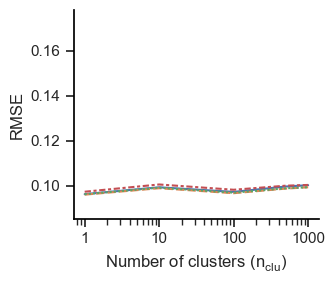

In [104]:
def plot_single_error(metric, name, country, df_metrics, add_legend):
    if add_legend == True:
        fig, axes = plt.subplots(1, figsize=(3.5, 3))
    else:
        fig, axes = plt.subplots(1, figsize=(3.5, 3))
    
    sns.lineplot(
        x='num_clu',
        y=metric,
        hue ="time_res",
        style= "time_res",
        hue_order = ['month', 'bimonth', 'season', 'fixed'],
        style_order= ['month', 'bimonth', 'season', 'fixed'],
        data = df_metrics[(df_metrics['time_res'] != 'uncorrected')],
        ax = axes,
        legend = add_legend
    )
    
    axes.set_xscale('log')
    axes.set_ylabel(metric.upper())
    axes.set_xlabel('Number of clusters ($n_{clu}$)')
    axes.set_xticks([1, 10, 100,1000])
    axes.get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())
    axes.set_ylim(0.085,0.178)
    

    if add_legend == True:
        axes.get_legend().remove()
        handles, labels = plt.gca().get_legend_handles_labels()
        labels = ['Monthly', 'Bimonthly',  'Seasonal', 'Fixed'] # renaming labels
        # plt.legend(handles, labels, ncol=1, loc='right', bbox_to_anchor=(1.445, 0.5), title='$t_{freq}$')
        plt.figlegend(handles, labels, loc = 'center left', bbox_to_anchor=(-0.5, 0.5), ncol=1, title='Temporal Frequency\n            ($t_{freq}$)', frameon=False)
    
    plt.tight_layout()
    plt.savefig('run/paper-plot/'+country+'_'+name+'_test_rmse.png', bbox_inches='tight')
    
# plot_single_error('rmse', 'original', country, original_metrics, False)
# plot_single_error('rmse', 'miss30', country, missing30_metrics, False)
# plot_single_error('rmse', 'miss50', country, missing50_metrics, False)
# plot_single_error('rmse', 'trainvestas', country, trained_vestas_metrics, False)
# plot_single_error('rmse', 'trainge', country, trained_ge_metrics, False)
plot_single_error('rmse', 'testvestas', country, original_metrics, False)
# plot_single_error('rmse', 'testge', country, original_metrics, False)

# plot_single_error('rmse', 'train_rmse', country, train_metrics, True)
# plot_overall_error(run, country, train_metrics, 'train')

In [66]:
# monthly diff of the temporal errors
turb_info_train = pd.read_csv(run+'/training/simulated-turbines/'+country+'_train_turb_info.csv')
train_obs = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_obs_cf.csv')

turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')
test_obs = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_obs_cf.csv', parse_dates=['time'])
turb_info['In training?'] = np.where(turb_info.ID.isin(turb_info_train.ID), 'Yes', 'No')

monthly_diff = uncor_error('monthly-error', run, country, turb_info, [1,700,3300], time_res_list, False, 2020)
train_monthly_diff = uncor_error('monthly-error', run, country, turb_info_train,[1],['fixed'], True)

diff_diff = train_monthly_diff[((train_monthly_diff['time_res'] == 'uncorrected')) & (train_monthly_diff['type'] == 'onshore')]
diff_diff['diff_diff'] = np.abs(train_monthly_diff[((train_monthly_diff['time_res'] == 'uncorrected')) & (train_monthly_diff['type'] == 'onshore')]['diff']-monthly_diff[((monthly_diff['time_res'] == 'uncorrected')) & (monthly_diff['type'] == 'onshore')]['diff'])
# diff_diff

plt.figure(figsize=(4,2.8))
base_clu = 1
sns.lineplot(
    x='month',y='diff',
    data = train_monthly_diff[((train_monthly_diff['time_res'] == 'uncorrected')) & (train_monthly_diff['type'] == 'onshore')],
    color = '#471164FF', linestyle='--', label='Train (2015-2019)',
    legend = True
)
sns.lineplot(
    x='month',y='diff',
    data = monthly_diff[((monthly_diff['time_res'] == 'uncorrected')) & (monthly_diff['type'] == 'onshore')],
    color = '#471164FF', label='Test (2020)',
    legend = True
)

# sns.lineplot(
#     x='month',y='diff_diff',
#     data = diff_diff[((diff_diff['time_res'] == 'uncorrected')) & (diff_diff['type'] == 'onshore')],
#     color = 'b', linestyle='dotted', label='DIFFFFFF',
#     legend = True
# )

handles, labels = plt.gca().get_legend_handles_labels()
plt.ylabel('Percentage Error, %')
plt.xlabel('Month')
# plt.ylim(0,80)
plt.xticks(range(1,13))
plt.legend(handles, labels, ncol=1, loc='best')
plt.tight_layout()
# plt.savefig(run+'/plots/'+country+'_monthly_difference_unc.png', bbox_inches='tight')

KeyError: "['In training?'] not in index"

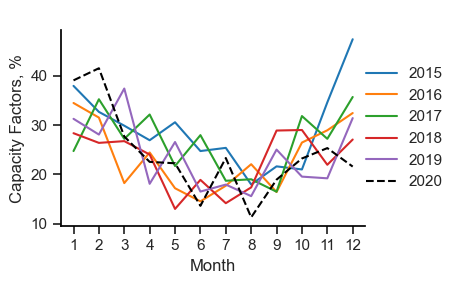

In [53]:
def wavg_cf_monthly(df, turb_info):
    """
    Calculates the weighted monthly capacity factor by capacity.
    
    Args:
        df (pandas.DataFrame): time-series of capacity factors for turbines/farms
        turb_info (pandas.DataFrame): turbine metadata including height and coordinates
        
    Returns:
        series: weighted average of capacity factor for dataframe
    """
    df = df.groupby(pd.Grouper(key='time',freq='M')).mean()
    df = df.reset_index()
    df = df.melt(
            id_vars=["time"], # adding in turbine ID for merging
            var_name="ID", 
            value_name="cf"
        )
    
    df["ID"] = df["ID"].astype(str)
    turb_info["ID"] = turb_info["ID"].astype(str)
    df = pd.merge(df, turb_info[['ID','capacity']], on=['ID'], how='left')

    def weighted_avg(df, values, weights):
            return (df[values] * df[weights]).sum() / df[weights].sum()

    wavg = lambda x: weighted_avg(df.loc[x.index], 'cf', 'capacity')
    
    df = df.groupby(pd.Grouper(key='time',freq='M')).agg({"cf": wavg})
    return df.reset_index()

def wavg_cf_monthly_train(df, turb_info):  
    df["ID"] = df["ID"].astype(str)
    turb_info["ID"] = turb_info["ID"].astype(str)
    df = pd.merge(df, turb_info[['ID','capacity']], on=['ID'], how='left')

    def weighted_avg(df, values, weights):
            return (df[values] * df[weights]).sum() / df[weights].sum()

    wavg = lambda x: weighted_avg(df.loc[x.index], 'cf', 'capacity')
    
    df = df.groupby(['month']).agg({"cf": wavg})
    
    return df.reset_index()

obs_cf_test = wavg_cf_monthly(test_obs, turb_info)
obs_cf_test['year'] = pd.DatetimeIndex(obs_cf_test['time']).year
obs_cf_test['month'] = pd.DatetimeIndex(obs_cf_test['time']).month
obs_cf_test = obs_cf_test.drop('time',axis=1)[['year','month','cf']]
obs_cf_test['cf'] = obs_cf_test['cf'] * 100

gen_train = pd.read_csv(run+'/training/'+country+'_train_gen_cf.csv')
gen_train["ID"] = gen_train["ID"].astype(str)
turb_info_train["ID"] = turb_info_train["ID"].astype(str)
gen_train = pd.merge(gen_train, turb_info_train[['ID','capacity']], on=['ID'], how='left')

def weighted_avg(df, values, weights):
        return (df[values] * df[weights]).sum() / df[weights].sum()
    
wavg = lambda x: weighted_avg(gen_train.loc[x.index], 'sim', 'capacity')
wavg2 = lambda x: weighted_avg(gen_train.loc[x.index], 'obs', 'capacity')

comp_month = gen_train.groupby(['year','month']).agg({"sim": wavg, "obs": wavg2}).reset_index()
comp_month['sim'] = comp_month['sim']*100
comp_month['obs'] = comp_month['obs']*100

df_sim = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_unc_cf.csv', parse_dates=['time'])
df_sim['time'] = pd.to_datetime(df_sim['time'])
df_sim['month'] = df_sim.time.dt.month
df_sim_monthly = df_sim.drop(columns=['time']).groupby(['month']).mean().reset_index()
df_sim_monthly = df_sim_monthly.melt(id_vars=['month'], var_name='ID', value_name='cf')

df_sim_monthly = pd.merge(df_sim_monthly, turb_info_train[['ID','capacity']], on=['ID'], how='left')

def weighted_avg(df, values, weights):
        return (df[values] * df[weights]).sum() / df[weights].sum() *100
    
wavg = lambda x: weighted_avg(df_sim_monthly.loc[x.index], 'cf', 'capacity')

df_sim_monthly = df_sim_monthly.groupby('month').agg({"cf": wavg}).reset_index()

plt.figure(figsize=(5,3))

sns.lineplot(
    x= "month", y= "obs", data = comp_month,hue='year',estimator = 'mean', errorbar='sd', legend = True, palette="tab10"
    )

sns.lineplot(
    x= "month", y= "cf", data = obs_cf_test,
    legend = True, color = 'black', label ='2020',linestyle='--'
)
# sns.lineplot(
#     x= "month", y= "sim", data = comp_month, estimator = 'mean', errorbar='sd',
#     color='g', label='Sim (2015-2019)', legend = True)
# sns.lineplot(
#     x= "month", y= "cf", data = df_sim_monthly, estimator = 'mean', errorbar='sd',
#     color='r', label='Sim (2020)', legend = True)

handles, labels = plt.gca().get_legend_handles_labels()
plt.ylabel('Capacity Factors, %')
plt.xlabel('Month')
plt.xlim(0.5, 12.5)
plt.xticks(range(1,13))
plt.title(' ')
# plt.figlegend(handles, labels, loc = 'center left', bbox_to_anchor=(-0.25, 0.5), ncol=1, title='Temporal Frequency\n            ($t_{freq}$)', frameon=False)
plt.legend(handles, labels, ncol=1, loc='center right', frameon=False, bbox_to_anchor=(1.3, 0.5))
plt.tight_layout()
plt.savefig(run+'/plots/'+country+'_obs_cf.png', bbox_inches='tight')

In [82]:
monthly_diff

,In training?,month,num_clu,time_res,diff
0,No,1,1,uncorrected,0.195212
1,Yes,1,1,uncorrected,0.156886
2,No,2,1,uncorrected,0.220797
3,Yes,2,1,uncorrected,0.158495
4,No,3,1,uncorrected,0.148744
...,...,...,...,...,...
463,Both,8,3300,month,0.011566
464,Both,9,3300,month,0.013943
465,Both,10,3300,month,0.019779
466,Both,11,3300,month,0.069890


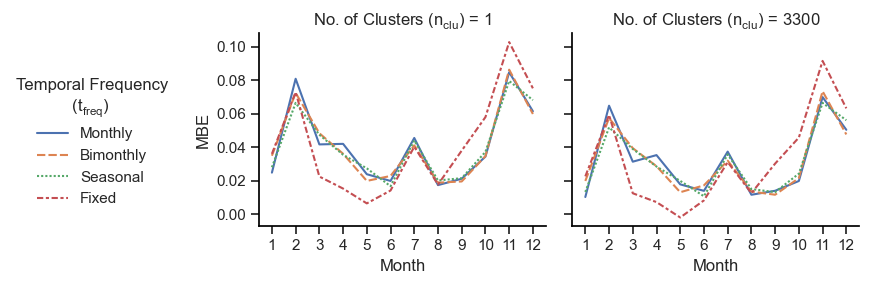

In [58]:
def plot_monthly_error(run, country, df_metrics):
    base_clu = 1
    fig, axes = plt.subplots(1,2, figsize=(7, 3),sharey='all')
    sns.lineplot(
        x='month',y='diff',
        data = df_metrics[((df_metrics['num_clu'] == base_clu) & (df_metrics['time_res'] != 'uncorrected')) & (df_metrics['In training?'] == 'Both')],
        hue ="time_res",style="time_res",
        hue_order = ['month', 'bimonth', 'season', 'fixed'],
        style_order= ['month', 'bimonth', 'season', 'fixed'],
        ax = axes[0],legend = False
    )

    sns.lineplot(
        x='month',y='diff',
        data = df_metrics[((df_metrics['num_clu'] == 3300)) & (df_metrics['In training?'] == 'Both')],
        hue ="time_res",style="time_res",
        hue_order = ['month', 'bimonth', 'season', 'fixed'],
        style_order= ['month', 'bimonth', 'season', 'fixed'],
        ax = axes[1],legend = True
    )
    
    axes[0].set_ylabel('MBE')
    axes[0].set_xlabel('Month')
    axes[0].set_xticks(range(1,13))
    axes[0].set_title(r'No. of Clusters ($n_{clu}$) = 1')
    axes[1].set_ylabel('MBE')
    axes[1].set_xlabel('Month')
    axes[1].set_xticks(range(1,13))
    axes[1].set_xticks(range(1,13))
    # axes[1].set_ylim(0,80)
    axes[1].set_title(r'No. of Clusters ($n_{clu}$) = 3300')
    # axes[2].set_ylabel('Absolute Error')
    # axes[2].set_xlabel('Month')
    # axes[2].set_xticks(range(1,13))
    # axes[2].set_title('Offshore')
    
    # fixing the legend labels and sharing it over whole plot.
    axes[1].get_legend().remove()
    handles, labels = plt.gca().get_legend_handles_labels()
    labels = ['Monthly', 'Bimonthly',  'Seasonal', 'Fixed'] # renaming labels
    # plt.legend(handles, labels, ncol=1, loc='right', bbox_to_anchor=(1.5, 0.5), title='Temporal Frequency ($t_{freq}$)')
    # plt.figlegend(handles, labels, loc = 'upper center', bbox_to_anchor=(0.5, 1.2), ncol=5, title='Temporal Frequency ($t_{freq}$)')
    plt.figlegend(handles, labels, loc = 'center left', bbox_to_anchor=(-0.25, 0.5), ncol=1, title='Temporal Frequency\n            ($t_{freq}$)', frameon=False)
    # plt.figlegend(handles, labels, loc = 'center right', bbox_to_anchor=(1.15, 0.5), ncol=1, title='Temporal Frequency\n            ($t_{freq}$)', frameon=False)
    plt.tight_layout()
    plt.savefig(run+'/plots/'+country+'_monthly_difference.png', bbox_inches='tight')
    return plt.tight_layout()
    
# monthly_diff = uncor_error('monthly-error', run, country, turb_info, [1,700,3300], time_res_list, False, 2020)
plot_monthly_error(run, country, monthly_diff)

### Spatial Impact

In [59]:
spatial_metrics = overall_error('spatial-focus', run, country, turb_info, cluster_list, time_res_list, False, 2020)
turb_old = turb_info.loc[turb_info['In training?'] == 'Yes'].copy().reset_index(drop=True)
total_old_metrics = overall_error('spatial-focus', run, country, turb_old, cluster_list, time_res_list, False, 2020)
turb_new = turb_info.loc[turb_info['In training?'] == 'No'].copy().reset_index(drop=True)
total_new_metrics = overall_error('spatial-focus', run, country, turb_new, cluster_list, time_res_list, False, 2020)

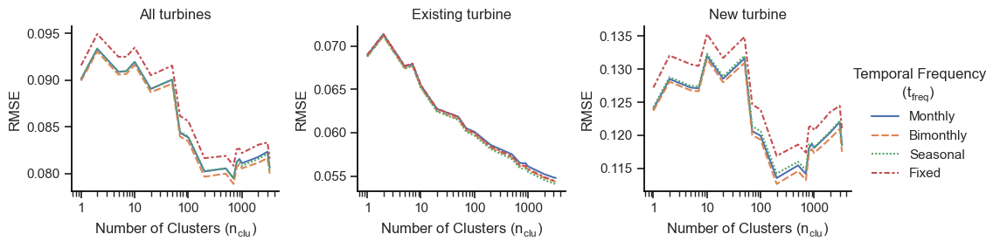

In [60]:
# spatial plotting
fig, axes = plt.subplots(1, 3, figsize=(10, 3))
sns.lineplot(
    x='num_clu',
    y='rmse',
    hue ="time_res",
    style="time_res",
    hue_order = ['month', 'bimonth', 'season', 'fixed'],
    style_order= ['month', 'bimonth', 'season', 'fixed'],
    data = spatial_metrics[(spatial_metrics['time_res'] != 'uncorrected')],
    ax = axes[0],
    legend = False
)

axes[0].set_title('All turbines')
axes[0].set_xscale('log')
axes[0].set_ylabel('RMSE')
axes[0].set_xlabel('Number of Clusters ($n_{clu}$)')
axes[0].set_xticks([1, 10, 100,1000])
axes[0].get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

sns.lineplot(
    x='num_clu',
    y='rmse',
    hue ="time_res",
    style="time_res",
    hue_order = ['month', 'bimonth', 'season', 'fixed'],
    style_order= ['month', 'bimonth', 'season', 'fixed'],
    data = total_old_metrics[(total_old_metrics['time_res'] != 'uncorrected')],
    ax = axes[1],
    legend = False
)
axes[1].set_title('Existing turbine')
axes[1].set_xscale('log')
axes[1].set_ylabel('RMSE')
axes[1].set_xlabel('Number of Clusters ($n_{clu}$)')
axes[1].set_xticks([1, 10, 100,1000])
axes[1].get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())

sns.lineplot(
    x='num_clu',
    y='rmse',
    hue ="time_res",
    style= "time_res",
    hue_order = ['month', 'bimonth', 'season', 'fixed'],
    style_order= ['month', 'bimonth', 'season', 'fixed'],
    data = total_new_metrics[(total_new_metrics['time_res'] != 'uncorrected')],
    ax = axes[2],
    legend = True
)

axes[2].set_title('New turbine')
axes[2].set_xscale('log')
axes[2].set_ylabel('RMSE')
axes[2].set_xlabel('Number of Clusters ($n_{clu}$)')
axes[2].set_xticks([1, 10, 100,1000])
axes[2].get_xaxis().set_major_formatter(matplotlib.ticker.ScalarFormatter())



# fig.suptitle(name)
axes[2].get_legend().remove()
handles, labels = plt.gca().get_legend_handles_labels()
labels = ['Monthly', 'Bimonthly',  'Seasonal', 'Fixed'] # renaming labels
# plt.legend(handles, labels, ncol=1, loc='right', bbox_to_anchor=(1.4, 0.5), title='$t_{freq}$')
# plt.legend(handles, labels, ncol=4, loc='upper left', bbox_to_anchor=(0, 1), title='$t_{freq}$')
# plt.figlegend(handles, labels, loc = 'upper center', bbox_to_anchor=(0.5, 1.2), ncol=4, title='Temporal Frequency ($t_{freq}$)')
plt.figlegend(handles, labels, loc = 'center right', bbox_to_anchor=(1.15, 0.5), ncol=1, title='Temporal Frequency\n            ($t_{freq}$)', frameon=False)
plt.tight_layout()
plt.savefig(run+'/plots/'+country+'_spatial_separate_test_error.png', bbox_inches='tight')

region
0    1414
2     826
1     809
6     527
3     472
5     375
4     364
7      47
Name: count, dtype: int64


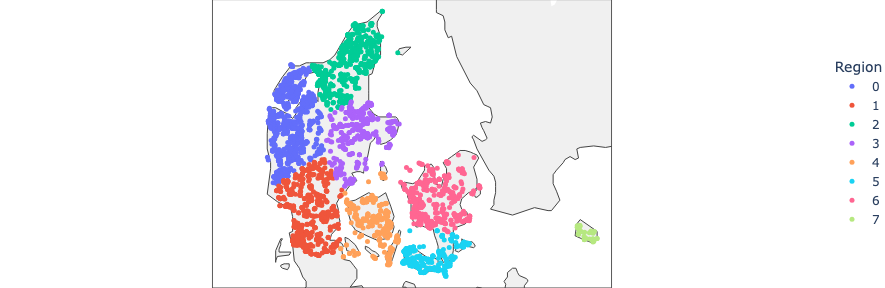

In [61]:
def regional_info(regions,turb_info, turb_base, remove=None):
    # create the regional index
    kmeans = KMeans(
                init="random",
                n_clusters = regions,
                n_init = 10,
                max_iter = 300,
                random_state = 42
            )
    kmeans.fit(turb_base[['lat','lon']])
    
    # adding cluster labels to data
    turb_info['region_delete'] = kmeans.predict(turb_info[['lat','lon']])
    # turb_info['distance'] = kmeans.transform(turb_info[['lat','lon']]).min(axis=1)
    
    # order the clusters/labels from left to right
    region_info = turb_info.groupby('region_delete', as_index=False)[['lat','lon']].mean()
    region_info = region_info.sort_values('lon').reset_index(drop=True)
    region_info['region'] = region_info.index
    turb_info = turb_info.merge(region_info[['region_delete','region']], on='region_delete',how='left')
    turb_info = turb_info.drop('region_delete',axis=1)

    if remove == 'new_offshore':
    ## Use this to filter out offshore etc for plotting
        turb_info = turb_info.drop(turb_info[(turb_info['type'] == 'offshore') & (turb_info['In training?'] == 'No')].index).reset_index(drop=True)
    elif remove == 'all_offshore':
        turb_info = turb_info.drop(turb_info[(turb_info['type'] == 'offshore')].index).reset_index(drop=True)
    # turb_info = turb_info.drop(turb_info[(turb_info['In training?'] == 'No')].index).reset_index(drop=True)
    
    # X_dist = kmeans.transform(turb_info[['lat','lon']])**2
    # df = pd.DataFrame(X_dist.sum(axis=1).round(2), columns=['sqdist'])
    # turb_info['sqdist'] = turb_info['sqdist']
    
    return turb_info

regions = 8
region_info_test = regional_info(regions, turb_info[turb_info['type']=='onshore'].copy(), turb_info_train[turb_info_train['type'] == 'onshore'].copy())
region_info_test['region'] = region_info_test['region'].astype(str)

fig = px.scatter_geo(region_info_test, lat ='lat',lon ='lon', color = 'region', category_orders={"region": ["0","1", "2", "3", "4", "5","6","7", "8","9","10","11"]})
print(region_info_test.region.value_counts())
fig.update_geos(
    resolution=50, 
    center=dict(lon=11.2, lat=56.2),
    lataxis_range=[54.6, 58], 
    lonaxis_range=[7,15.5],
    projection_type='mercator',
    landcolor=bg_colour
)
fig.update_traces(marker=dict(size=5))

fig.update_layout(
    margin=dict(l=0, r=0, t=0, b=0),width = 384, height = 288,
    # legend=dict(orientation="h", yanchor="bottom", y=1.01, xanchor="center", x=0.5, title="Region",
    legend=dict(orientation="v", yanchor="middle", y=0.5, xanchor="left", x=1.01, title="Region",
    
    # bordercolor="Black",borderwidth=1
    ),legend_title_side='top center' 
)
fig.show()

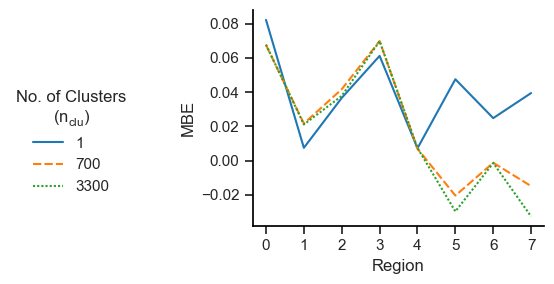

In [62]:
def plot_regional_error(run, country, df_metrics):
    # metric = 'rmse' # choose between 'mae', 'rmse'
    base_clu = 1
    choice_clu = 1
    choice_clu2 = 700
    choice_clu3 = 3300
    fig, axes = plt.subplots(1, figsize=(4, 3),sharey='all')
    sns.lineplot(
        x='region',y='diff',
        data = df_metrics[((df_metrics['time_res'] == 'fixed') & (df_metrics['In training?'] =='Both')) & ((df_metrics['num_clu'] == base_clu) | (df_metrics['num_clu'] == choice_clu) | (df_metrics['num_clu'] == choice_clu2)| (df_metrics['num_clu'] == choice_clu3))],
        hue ="num_clu",style="num_clu",palette="tab10",
        ax = axes,
        legend = True
    )

    # sns.lineplot(
    #     x='region',y='diff',
    #     data = df_metrics[((df_metrics['time_res'] == 'fixed') & (df_metrics['In training?'] =='Yes')) & ((df_metrics['num_clu'] == base_clu) | (df_metrics['num_clu'] == choice_clu) | (df_metrics['num_clu'] == choice_clu2)| (df_metrics['num_clu'] == choice_clu3))],
    #     hue ="num_clu",style="num_clu",palette="tab10",
    #     ax = axes[1],
    #     legend = False
    # )

    # sns.lineplot(
    #     x='region',y='diff',
    #     data = df_metrics[((df_metrics['time_res'] == 'fixed') & (df_metrics['In training?'] =='Both')) & ((df_metrics['num_clu'] == base_clu) | (df_metrics['num_clu'] == choice_clu) | (df_metrics['num_clu'] == choice_clu2)| (df_metrics['num_clu'] == choice_clu3))],
    #     hue ="num_clu",style="num_clu",palette="tab10",
    #     ax = axes[2],
    #     legend = True
    # )

    axes.set_xticks(range(0,8))
    # axes[0].set_title('All turbines')
    axes.set_ylabel('MBE')
    # axes[0].set_ylabel('Absolute Error')
    axes.set_xlabel('Region')

    
    # axes[0].set_xticks(range(0,8))
    # # axes[0].set_title('All turbines')
    # axes[0].set_ylabel('Percentage Error, %')
    # # axes[0].set_ylabel('Absolute Error')
    # axes[0].set_xlabel('Region')

    # axes[1].set_xticks(range(0,8))
    # # axes[1].set_title('Existed in training')
    # # axes[1].set_ylabel('Absolute Error')
    # axes[1].set_xlabel('Region')

    # axes[2].set_xticks(range(0,8))
    # # axes[2].set_title('Not in training')
    # # axes[2].set_ylabel('Absolute Error')
    # axes[2].set_xlabel('Region')
    
    # fixing the legend labels and sharing it over whole plot.
    axes.get_legend().remove()
    handles, labels = plt.gca().get_legend_handles_labels()
    # labels = ['1', '10','1000']
    # plt.legend(handles, labels, ncol=1, loc='right', bbox_to_anchor=(1.3, 0.5), title='Number of Clusters ($n_{clu}$)')
    # plt.figlegend(handles, labels, loc = 'upper center', bbox_to_anchor=(0.5, 1.2), ncol=4, title='Number of Clusters ($n_{clu}$)', frameon=False)
    # plt.figlegend(handles, labels, loc = 'center right', bbox_to_anchor=(1.1, 0.5), ncol=1, title='No. of Clusters\n        ($n_{clu}$)', frameon=False)
    plt.figlegend(handles, labels, loc = 'center left', bbox_to_anchor=(-0.4, 0.5), ncol=1, title='No. of Clusters\n        ($n_{clu}$)', frameon=False)

    plt.tight_layout()
    plt.savefig(run+'/plots/'+country+'_regional_difference.png', bbox_inches='tight')
    return plt.tight_layout()

# region_info_test = regional_info(regions, turb_info, turb_info_train.copy())
region_error = uncor_error('regional-error', run, country, region_info_test, [1,700,3300], ['fixed'], False, 2020)
plot_regional_error(run, country, region_error)

In [1]:
regions = 8
number_clu = 2

# turbine errors

# monthly diff of the temporal errors
turb_info_train = pd.read_csv(run+'/training/simulated-turbines/'+country+'_train_turb_info.csv')
train_obs = pd.read_csv(run+'/results/capacity-factor/'+country+'_train_obs_cf.csv')

turb_info = pd.read_csv(run+'/training/simulated-turbines/'+country+"_"+str(year_test)+'_turb_info.csv')
test_obs = pd.read_csv(run+'/results/capacity-factor/'+country+"_"+str(year_test)+'_obs_cf.csv', parse_dates=['time'])
turb_info['In training?'] = np.where(turb_info.ID.isin(turb_info_train.ID), 'Yes', 'No')

# monthly_diff = uncor_error('monthly-error', run, country, turb_info, [1,700,3300], time_res_list, False, 2020)
# train_monthly_diff = uncor_error('monthly-error', run, country, turb_info_train,[1],['fixed'], True)

turb_error_test = uncor_error('turbine-error', run, country, turb_info, [number_clu], ['fixed'], False, 2020)
turb_error_test['ID'] = turb_error_test['ID'].astype(str)
turb_error_test['turb_err'] =  np.abs(turb_error_test['diff'])

# regional labels & error
# region_info_test = regional_info(regions, turb_info[turb_info['type']=='onshore'].copy(), turb_info_train[turb_info_train['type'] == 'onshore'].copy())
region_info_test = regional_info(regions, turb_info.copy(), turb_info_train.copy())
region_info_test['ID'] = region_info_test['ID'].astype(str)
plot_error = pd.merge(turb_error_test, region_info_test[['ID', 'capacity','region']], on='ID')
region_sum_cap = region_info_test.groupby('region')['capacity'].sum().reset_index()
region_sum_cap.columns = 'region', 'max_capacity_region'
plot_error = pd.merge(plot_error, region_sum_cap, on='region')

# cluster info that the training is done on and merged onto the test info
clus_info_train = cluster_turbines(number_clu, turb_info_train, True)
clus_info_test = cluster_turbines(number_clu, turb_info_train, False, turb_info.copy())
clus_info_test['ID'] = clus_info_test['ID'].astype(str)


def weighted_avg(df, values, weights):
    return (df[values] * df[weights]).sum() / df[weights].sum()

wavg_capacity = lambda x: weighted_avg(clus_info_train.loc[x.index], 'capacity', 'capacity')
wavg_height = lambda x: weighted_avg(clus_info_train.loc[x.index], 'height', 'capacity')
wavg_density = lambda x: weighted_avg(clus_info_train.loc[x.index], 'p_density', 'capacity')
wavg_diameter = lambda x: weighted_avg(clus_info_train.loc[x.index], 'diameter', 'capacity')
# weighted_clusters = clus_info_train.groupby('cluster').agg({'capacity': wavg_capacity, 'height': wavg_height, 'p_density': wavg_density, 'diameter': wavg_diameter}).reset_index()

weighted_clusters = clus_info_train.groupby('cluster')[['capacity','height','p_density','diameter']].mean().reset_index()
weighted_clusters.columns = 'cluster', 'clu_capacity', 'clu_height', 'clu_density', 'clu_diameter'
plot_error = pd.merge(plot_error, clus_info_test[['ID', 'cluster','lat','lon','In training?','height','p_density','diameter']], on='ID')
plot_error = pd.merge(plot_error, weighted_clusters, on='cluster')

# calculating the errors
# plot_error['err_height'] = ((plot_error['height']-plot_error['clu_height'])/(plot_error['clu_height']))*100
# plot_error['err_density'] = ((plot_error['p_density']-plot_error['clu_density'])/(plot_error['clu_density']))*100
# plot_error['err_capacity'] = ((plot_error['capacity']-plot_error['clu_capacity'])/(plot_error['clu_capacity']))*100
# plot_error['err_diameter'] = ((plot_error['diameter']-plot_error['clu_diameter'])/(plot_error['diameter']))*100
plot_error['err_capacity'] = (np.abs(plot_error['clu_capacity']-plot_error['capacity'])/((plot_error['clu_capacity']+plot_error['capacity'])/2))*100
plot_error['err_height'] = (np.abs(plot_error['clu_height']-plot_error['height'])/((plot_error['clu_height']+plot_error['height'])/2))*100
plot_error['err_density'] = (np.abs(plot_error['clu_density']-plot_error['p_density'])/((plot_error['clu_density']+plot_error['p_density'])/2))*100
plot_error['err_diameter'] = (np.abs(plot_error['clu_diameter']-plot_error['diameter'])/((plot_error['clu_diameter']+plot_error['diameter'])/2))*100

# plot_error['relative_error_region'] = ((plot_error['turb_err'])*plot_error['capacity'])/plot_error['max_capacity_region']
# plot_error['err_relative'] = (plot_error['turb_err']*plot_error['capacity'])/ (clus_info_test[clus_info_test['type']=='onshore'])['capacity'].sum()

plot_melt = plot_error[['ID','err_capacity','distance','err_height','err_diameter','err_diameter','turb_err','In training?']].melt(id_vars=['ID','turb_err', 'In training?'], var_name='error_type', value_name='percs')

NameError: name 'pd' is not defined

501.6231895636422 262.70406929472773
343.06149995614123 168.10256941385293
246.5899076881005 124.04814985747457
0.8190974071641625 0.6279124869541866


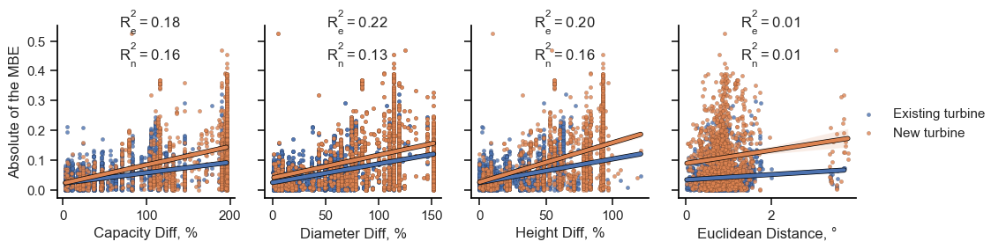

In [68]:
import scipy as sp
import matplotlib.patheffects as pe

g = sns.lmplot(data=plot_melt,x='percs',y='turb_err',
            hue='In training?', col="error_type",col_order=['err_capacity','err_diameter','err_height','distance'], 
            # x_bins=10,x_ci=None, ci=99,
            markers='o',
            truncate=True,
            facet_kws=dict(sharex=False, sharey=True),
            line_kws=dict(linewidth=3,path_effects=[pe.withStroke(linewidth=4,
                                                        foreground="black")]),
            scatter_kws=dict(linewidth=0.1,edgecolor='black',s=10),
            height=3, aspect=0.83,
               n_boot=1000,
               
)

g.axes[0,0].set_ylabel('Absolute of the MBE')
g.axes[0,0].set_xlabel('Capacity Diff, %')
g.axes[0,1].set_xlabel('Diameter Diff, %')
g.axes[0,2].set_xlabel('Height Diff, %')
g.axes[0,3].set_xlabel('Euclidean Distance, °')
g.set_titles(col_template='')
labels=['Existing turbine', 'New turbine']
g._legend.set_title(None)
g._legend.texts[0].set_text(labels[0])
g._legend.texts[1].set_text(labels[1])
sns.move_legend(g, "center right", bbox_to_anchor=(1.05, 0.5))


for ax, feature in zip(g.axes.flat, g.col_names):
    slope, intercept, r_value, p_value, std_err = sp.stats.linregress(plot_error[plot_error['In training?']=='Yes']['turb_err'], plot_error[plot_error['In training?']=='Yes'][feature])
    slope2, intercept, r_value2, p_value, std_err = sp.stats.linregress(plot_error[plot_error['In training?']=='No']['turb_err'], plot_error[plot_error['In training?']=='No'][feature])
    print(slope,slope2)
    ax.text(.35, .8, '$R_e^2=${:.2f}\n$R_n^2=${:.2f}'.format(r_value**2, r_value2**2),
            transform=ax.transAxes)


# def annotate(data, **kws):
#     r, p = sp.stats.pearsonr(data['turb_err'], data['percs'])
#     print(r)
#     ax = plt.gca()
#     ax.text(.1, .8, 'r={:.3f}, r={:.3f}'.format(r[0],r[1]),
#             transform=ax.transAxes)
# g.map_dataframe(annotate)

g.savefig(run+'/plots/'+country+'_spatial_error_correlation.png', bbox_inches='tight')
# plt.show(g)